In [2]:
from neo4j import GraphDatabase

def get_neo4j_driver() -> GraphDatabase.driver:
    """Establishes and returns a Neo4j session for AuraDB."""
    neo4j_uri = 'neo4j+s://9d1381c2.databases.neo4j.io:7687'
    neo4j_user = 'Shirley'
    neo4j_password = 'Sxl19950312'
    return GraphDatabase.driver(neo4j_uri, auth=(neo4j_user, neo4j_password))

# Call the function to get the driver
driver = get_neo4j_driver()

# Open a session
with driver.session() as session:
    # Verify connectivity within the session
    session.run("RETURN 1")

print("Connectivity verified successfully.")

Connectivity verified successfully.


In [3]:
from dash import Dash, dcc, html
import plotly.express as px
import pandas as pd


# Define a Cypher query to retrieve the required data
query = """
MATCH (n)
RETURN n
"""

# Execute the query and process the results
with driver.session() as session:
    result = session.run(query)
    neo4j_data = [record.data() for record in result]

# Converting Neo4j Data to Pandas DataFrame Format
df = pd.DataFrame(neo4j_data)

print(df)





                                                       n
0                                 {'name': 'Woolworths'}
1                                  {'name': 'Australia'}
2      {'address': 'Sydney Address Here', 'name': 'Sy...
3                                {'name': 'Coca - Cola'}
4                     {'name': 'CARBONATED SOFT DRINKS'}
...                                                  ...
19253          {'id': '73', 'productName': 'Röd Kaviar'}
19254       {'id': '74', 'productName': 'Longlife Tofu'}
19255  {'id': '75', 'productName': 'Rhönbräu Klosterb...
19256        {'id': '76', 'productName': 'Lakkalikööri'}
19257  {'id': '77', 'productName': 'Original Frankfur...

[19258 rows x 1 columns]


In [4]:
query = """
MATCH (n)
RETURN n
"""

# Use the apply() method in conjunction with the lambda function to extract 'productName'.
product_names = df['n'].apply(lambda x: x.get('category_name'))

#print results
print(product_names)





0        None
1        None
2        None
3        None
4        None
         ... 
19253    None
19254    None
19255    None
19256    None
19257    None
Name: n, Length: 19258, dtype: object


In [5]:
query = """
MATCH (p:Product)
RETURN p.name AS product
"""

# Execute the query and process the results
with driver.session() as session:
    result = session.run(query)
    # Iterate through the results and print the product name
    for record in result:
        product_name = record["product"]
        print("Product:", product_name)




Product: Coca - Cola Classic  Soft Drink Multipack Cans
Product: Coca - Cola Classic  Soft Drink Multipack Cans
Product: Coca - Cola Zero Sugar Soft Drink Multipack Cans
Product: Coca - Cola Classic  Soft Drink Multipack Cans
Product: Coca - Cola Zero Sugar Soft Drink Multipack Cans
Product: Coca - Cola Zero Sugar Soft Drink Multipack Cans
Product: Coca - Cola Classic  Soft Drink Mini Cans
Product: Coca - Cola Caffeine Free Zero Sugar Soft Drink Multipack Cans
Product: Coca - Cola Vanilla  Soft Drink Multipack Cans
Product: Coca - Cola Zero Sugar Soft Drink Mini Cans
Product: Indomie Mi Goreng Instant Noodles
Product: Maggi 2 Minute Chicken Flavour Instant Noodles
Product: Maggi 2 Minute Chicken Flavour Instant Noodles
Product: Supreme Noodles Cup Chicken Flavour
Product: Fantastic Chicken Noodle Cup
Product: Fantastic Chicken Noodle Bowl
Product: Indomie Mi Goreng Noodle Cup
Product: Maggi 2 Minute Beef Flavour Instant Noodles
Product: Supreme Noodles Cup Beef Flavour
Product: Indomen

In [6]:
query = """
MATCH (p)
RETURN count(p) AS productCount
"""

# Execute the query and process the results
with driver.session() as session:
    result = session.run(query)
    # Read the number of product nodes
    product_count = result.single()["productCount"]
    print("Number of products:", product_count)


Number of products: 19258


In [7]:
query = """
MATCH (p)
RETURN count(p) AS categoryCount
"""

# Execute the query and process the results
with driver.session() as session:
    result = session.run(query)
    # Read the number of product nodes
    category_count = result.single()["categoryCount"]
    print("Number of category:", category_count)

Number of category: 19258


In [8]:
query = """
MATCH (p)
RETURN count(p) AS recipeCount
"""

# Execute the query and process the results
with driver.session() as session:
    result = session.run(query)
    # Read the number of product nodes
    recipe_count = result.single()["recipeCount"]
    print("Number of recipe:", recipe_count)
    

Number of recipe: 19258


In [9]:
import plotly.express as px
import pandas as pd

query = """
MATCH (n)
RETURN(n) 
"""

# Convert to Pandas DataFrame
df = pd.DataFrame(neo4j_data)
#print(df)
# Use Plotly create box plot
# Expand the dictionary in the 'n' column to a DataFrame
df_n = pd.DataFrame(df['n'].tolist())

# Using the 'productName' column as a variable on the y-axis
fig = px.box(df_n, y='productName', points="all")


# show plot
fig.show()


In [10]:
query = """
MATCH (n)
RETURN(n) 
"""

# convert Pandas DataFrame
df = pd.DataFrame(neo4j_data)
#print(df)

# Expand the dictionary in the 'n' column to a DataFrame
df_n1 = pd.DataFrame(df['n'].tolist())


# Using the 'product' column as a variable on the y-axis
fig = px.box(df_n1, x='price', y='productName', points="all")


# show plot
fig.show()

In [11]:
query = """
MATCH (n)
RETURN(n) 
"""

# conver Pandas to DataFrame
df = pd.DataFrame(neo4j_data)
#print(df)
# use Plotly to create polt
# Expand the dictionary in the 'n' column to a DataFrame
#df_n1 = pd.DataFrame(df['n'].tolist())
print(df.columns)


# Using the 'product' column as a variable on the y-axis
#fig = px.box(df, x='name', y='category' )


# show plot
#fig.show()

Index(['n'], dtype='object')


In [12]:
import plotly.express as px

# use Plotly create box plot
fig = px.box(df, x=product_names, points="all")

# show plot
fig.show()


                                            Product                Category
0    Coca - Cola Classic  Soft Drink Multipack Cans  CARBONATED SOFT DRINKS
1    Coca - Cola Classic  Soft Drink Multipack Cans  CARBONATED SOFT DRINKS
2  Coca - Cola Zero Sugar Soft Drink Multipack Cans  CARBONATED SOFT DRINKS
3    Coca - Cola Classic  Soft Drink Multipack Cans  CARBONATED SOFT DRINKS
4  Coca - Cola Zero Sugar Soft Drink Multipack Cans  CARBONATED SOFT DRINKS


NameError: name 'product' is not defined

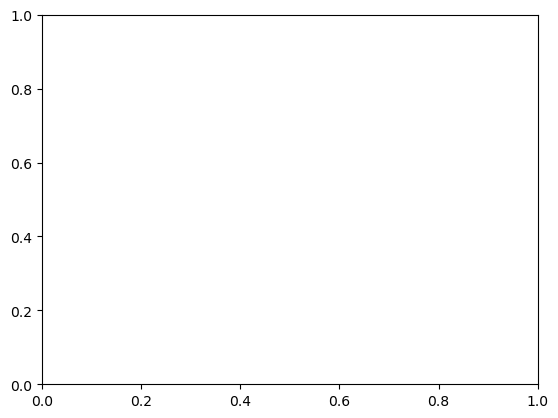

In [16]:
query = """
MATCH (p:Product)-[:STOCKED_IN]->(c:Category)
RETURN p.name AS Product, c.name AS Category
"""

with driver.session() as session:
    result = session.run(query)
    neo4j_data = [record.data() for record in result]

# convert to Pandas DataFrame
df = pd.DataFrame(neo4j_data)
print(df.head())

from neo4j import GraphDatabase
import pandas as pd
import plotly.express as px

# use Plotly to create box plot
fig = px.box(df, y='Product', x='Category', title='Product vs. Category Box Plot')

# show plot
fig.show()


# use Plotly to create scatter plot
fig1 = px.scatter(df, y='Product', x='Category', title='Product vs Category scatter plot')

# show plot
fig1.show()



In [14]:
query = """
MATCH (p:Category)-[:AVAILABLE_IN]->(c:Department)
RETURN p.name AS Category, c.name AS Department
"""

with driver.session() as session:
    result = session.run(query)
    neo4j_data = [record.data() for record in result]

# convert to Pandas DataFrame
df = pd.DataFrame(neo4j_data)
print(df.head())

from neo4j import GraphDatabase
import pandas as pd
import plotly.express as px

# use Plotly to create box plot
fig2 = px.box(df, x='Department', y='Category', title='Department vs. Category Box Plot')

# show plot
fig2.show()


# use Plotly to create scatter plot
fig3 = px.scatter(df, y='Department', x='Category', title='Department vs Category scatter plot')

# show plot
fig3.show()

                         Category Department
0          CARBONATED SOFT DRINKS  GROCERIES
1                    PASTA / RICE  GROCERIES
2  LIFESTYLE/WATER NON CARBONATED  GROCERIES
3                   CONFECTIONERY  GROCERIES
4                        BISCUITS  GROCERIES


In [15]:
#MATCH (p:Ingredient)-[:HAS_RESEARCH]->(c:IngredientResearch)
#RETURN p.name AS Ingredient, c.ingredient_name AS IngredientResearch

query = """
MATCH (p:Ingredient)-[:HAS_RESEARCH]->(c:IngredientResearch)
RETURN p.name AS Ingredient, c.ingredient_name AS IngredientResearch

"""

with driver.session() as session:
    result = session.run(query)
    neo4j_data = [record.data() for record in result]

# convert to Pandas DataFrame
df = pd.DataFrame(neo4j_data)
print(df.head())

from neo4j import GraphDatabase
import pandas as pd
import plotly.express as px

# use Plotly to create box plot
fig4 = px.box(df, x='IngredientResearch', y='Ingredient', title='IngredientResearch vs.Ingredient Box Plot')

# show plot
fig4.show()


# use Plotly to create scatter plot
fig5 = px.scatter(df, y='IngredientResearch', x='Ingredient', title='IngredientResearch vs Ingredient scatter plot')

# show plot
fig5.show()

# use Plotly to create scatter plot
fig6 = px.bar(df, y='IngredientResearch', x='Ingredient', title='IngredientResearch vs Ingredient bar plot')

# show plot
fig6.show()

         Ingredient    IngredientResearch
0  Carbonated Water      Carbonated Water
1             Sugar                 Sugar
2              150d  Colouring Agent 150d
3               338       Phosphoric Acid
4           Flavour               Flavour


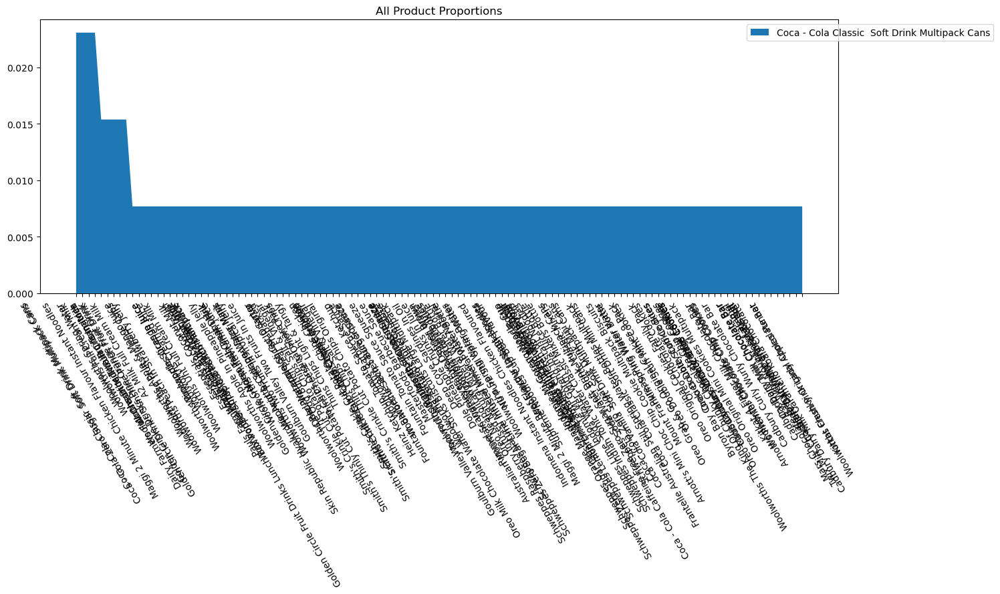

In [50]:
query = """
MATCH (p:Product)-[:STOCKED_IN]->(c:Category)
RETURN p.name AS Product, c.name AS Category
"""

with driver.session() as session:
    result = session.run(query)
    neo4j_data = [record.data() for record in result]

# convert to Pandas DataFrame
df = pd.DataFrame(neo4j_data)
#print(df.head())

from neo4j import GraphDatabase
import pandas as pd
import plotly.express as px

import matplotlib.pyplot as plt

# acheive top 10 products
top10_products = df['Product'].value_counts().head(10).index.tolist()

# Calculate the proportion of each product
product_counts = df['Product'].value_counts()
top10_proportions = [product_counts[p] / product_counts.sum() for p in top10_products]

fig, ax = plt.subplots(figsize=(10, 6))  # Increase the graphic size for display
ax.stackplot(top10_products, top10_proportions, labels=top10_products)
ax.legend(loc='upper left', bbox_to_anchor=(1.05, 1))  # Prevent the legend from being blocked
ax.set_title('Top 10 Product Proportions')
plt.xticks(rotation=45)  # If the product name is long, rotate the x-axis label
plt.tight_layout()
plt.show()

import matplotlib.pyplot as plt

# Get all products
products = df['Product'].value_counts().index.tolist()

# Calculate the proportion of each product
product_counts = df['Product'].value_counts()
proportions = product_counts / product_counts.sum()

fig, ax = plt.subplots(figsize=(15, 9))   # Increase the figure size for display
ax.stackplot(products, proportions, labels=products)
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1)) #Adjust the legend position to prevent it from being blocked
ax.set_title('All Product Proportions')
plt.xticks(rotation=120)  # If the product name is long, rotate the x-axis label
plt.tight_layout()
plt.show()


C:\Users\apple\AppData\Local\Temp\ipykernel_2404\3256449379.py:20: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



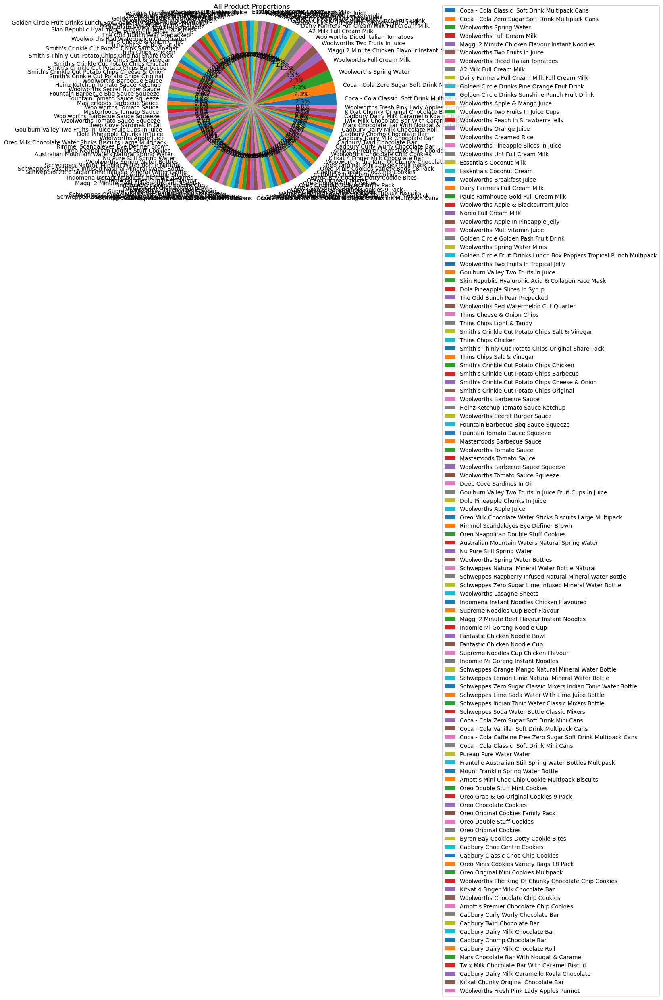

In [51]:
import matplotlib.pyplot as plt

# Get all products and corresponding counts
product_counts = df['Product'].value_counts()
products = product_counts.index.tolist()
counts = product_counts.values

# Calculate the proportion of each product
total_count = sum(counts)
proportions = [count/total_count for count in counts]

# Draw a pie chart
fig, ax = plt.subplots(figsize=(10, 6))
ax.pie(proportions, labels=products, autopct='%1.1f%%')
ax.axis('equal')  # Make sure the pie chart is circular
ax.set_title('All Product Proportions')

#Adjust label position to prevent overlap
plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.tight_layout()
plt.show()


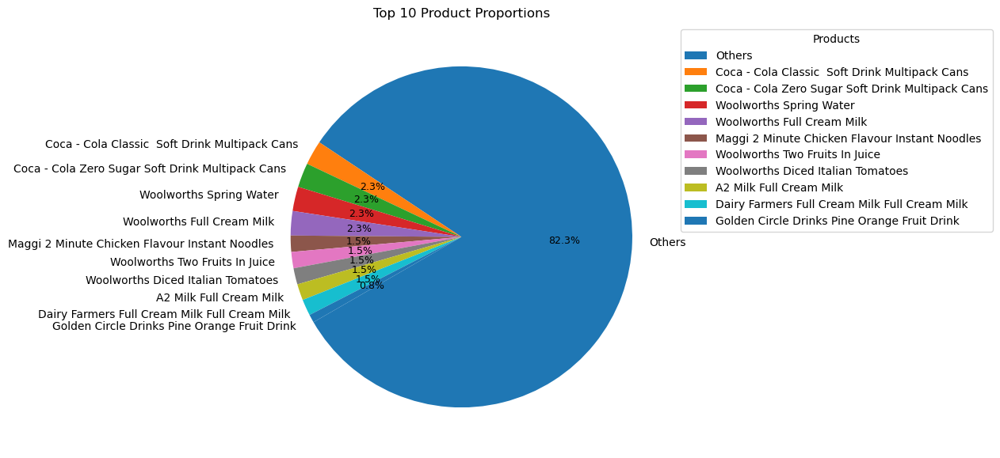

In [64]:
import matplotlib.pyplot as plt


product_counts = df['Product'].value_counts()
total_count = product_counts.sum()  # Total


proportions = product_counts / total_count  


top10_products = proportions.nlargest(10).index.tolist()
top10_proportions = [proportions[prod] for prod in top10_products]

# Calculate the total proportion of other products
others_proportion = 1 - sum(top10_proportions)


fig, ax = plt.subplots(figsize=(15, 7))
wedges, texts, autotexts = ax.pie([others_proportion] + top10_proportions, 
                                  labels=['Others'] + top10_products,
                                  autopct='%1.1f%%',
                                  startangle=-150)


plt.setp(autotexts, size=9)
ax.set_title('Top 10 Product Proportions')


ax.legend(wedges, ['Others'] + top10_products,
          title="Products",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1.5))

plt.show()

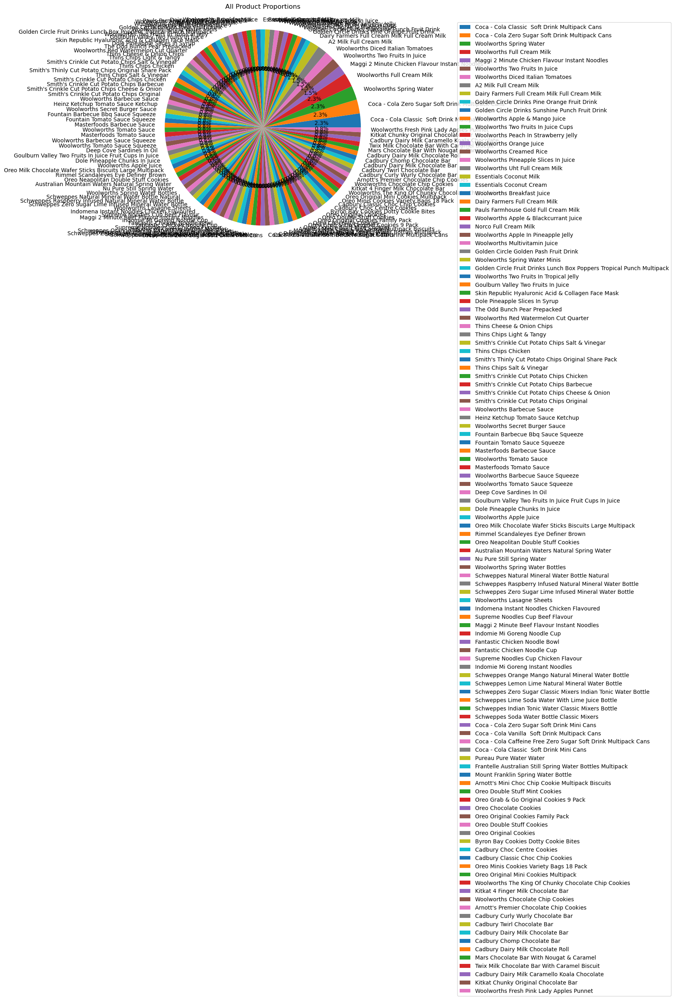

In [52]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 8))  
ax.pie(proportions, labels=products, autopct='%1.1f%%')
ax.axis('equal') 
ax.set_title('All Product Proportions', pad=20)

legend = ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.subplots_adjust(bottom=0.2)

fig.savefig('piechart.png', bbox_extra_artists=(legend,), bbox_inches='tight')

C:\Users\apple\AppData\Local\Temp\ipykernel_2404\3150386349.py:28: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



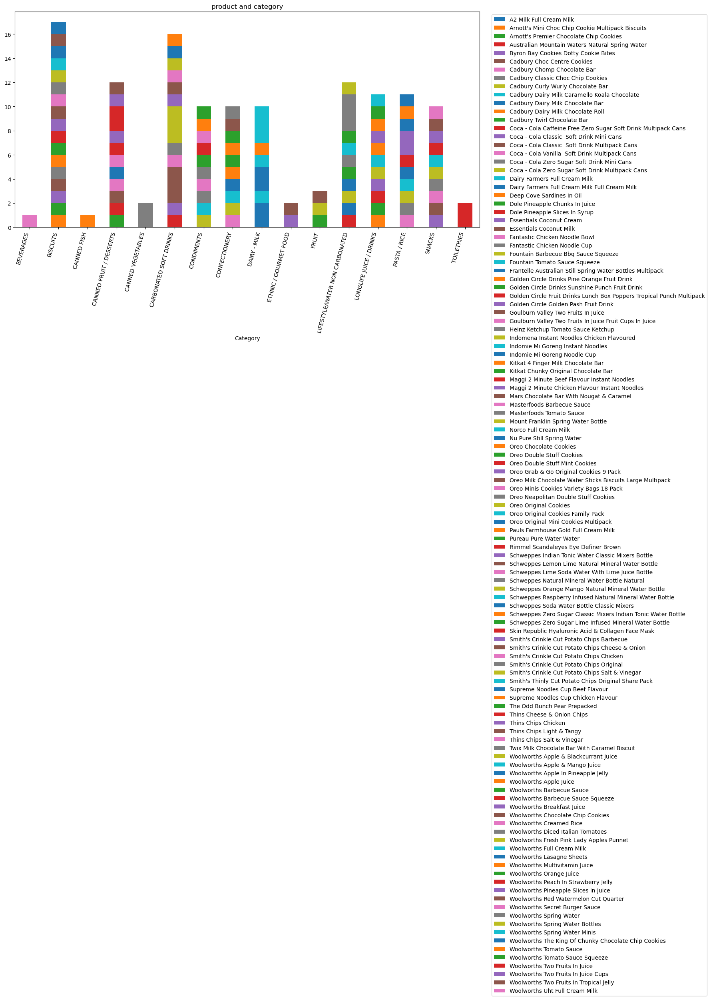

In [76]:
query = """
MATCH (p:Product)-[:STOCKED_IN]->(c:Category)
RETURN p.name AS Product, c.name AS Category
"""

with driver.session() as session:
    result = session.run(query)
    neo4j_data = [record.data() for record in result]

# convert to Pandas DataFrame
df = pd.DataFrame(neo4j_data)
#print(df.head())

import matplotlib.pyplot as plt


recipe_counts = df.groupby(['Category', 'Product']).size().unstack('Product', fill_value=0)


fig, ax = plt.subplots(figsize=(15, 7))
recipe_counts.plot(kind='bar', stacked=True, ax=ax)

#Adjust label position to prevent overlap
ax.set_title('product and category')
plt.xticks(rotation=75, ha='right')
legend = ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left')

plt.tight_layout()
plt.show()

C:\Users\apple\AppData\Local\Temp\ipykernel_2404\1989393660.py:17: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)

C:\Users\apple\AppData\Local\Temp\ipykernel_2404\1989393660.py:29: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

C:\Users\apple\AppData\Local\Temp\ipykernel_2404\1989393660.py:29: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.

c:\Users\apple\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



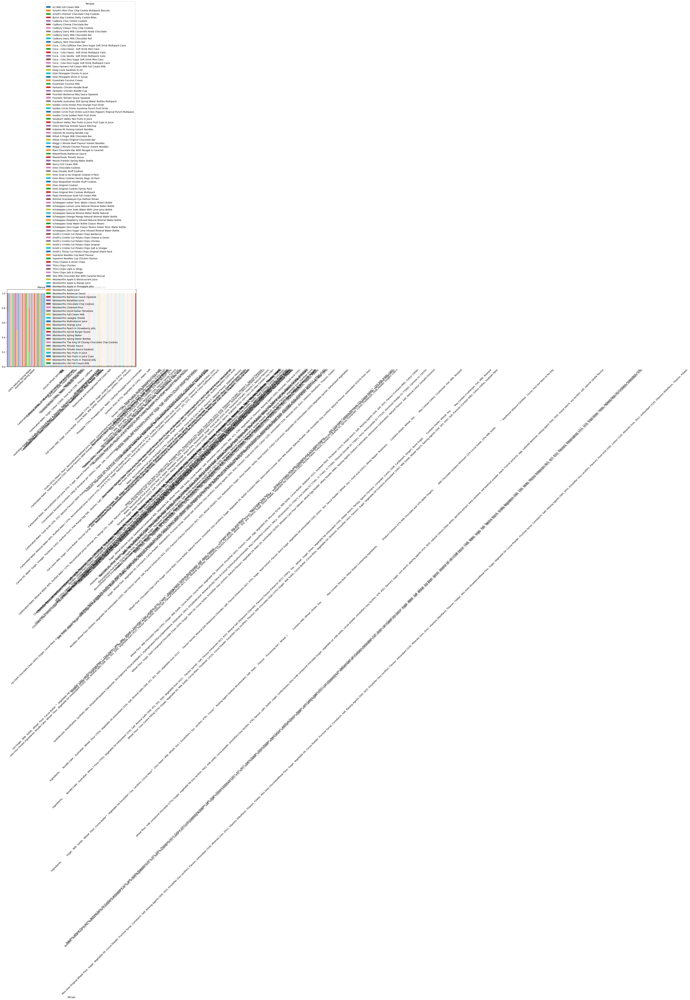

In [86]:
query = """
MATCH (p:Product)-[:HAS_RECIPE]->(c:Recipe)
RETURN p.name AS Product, c.ingredients_orig AS Recipe
"""

with driver.session() as session:
    result = session.run(query)
    neo4j_data = [record.data() for record in result]

# convert to Pandas DataFrame
df = pd.DataFrame(neo4j_data)
#print(df.head())

import matplotlib.pyplot as plt

# Calculate the proportion of each formula appearing in different products
recipe_props = df.groupby(['Recipe', 'Product']).size().groupby('Recipe').apply(lambda x: x/x.sum()).unstack('Product')

# Draw a percentage stacked bar chart
fig, ax = plt.subplots(figsize=(10, 6))
recipe_props.plot(kind='bar', stacked=True, ax=ax)

# Set title and rotated x-axis label

ax.set_title('Percentage of Recipes Used in Different Products') 
plt.xticks(rotation=45, ha='left')
plt.legend(title='Recipes')
#legend = ax.legend(bbox_to_anchor=(1.5, 1), loc='upper left')
plt.tight_layout()
plt.show()


C:\Users\apple\AppData\Local\Temp\ipykernel_2404\2755897371.py:20: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)

C:\Users\apple\AppData\Local\Temp\ipykernel_2404\2755897371.py:39: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



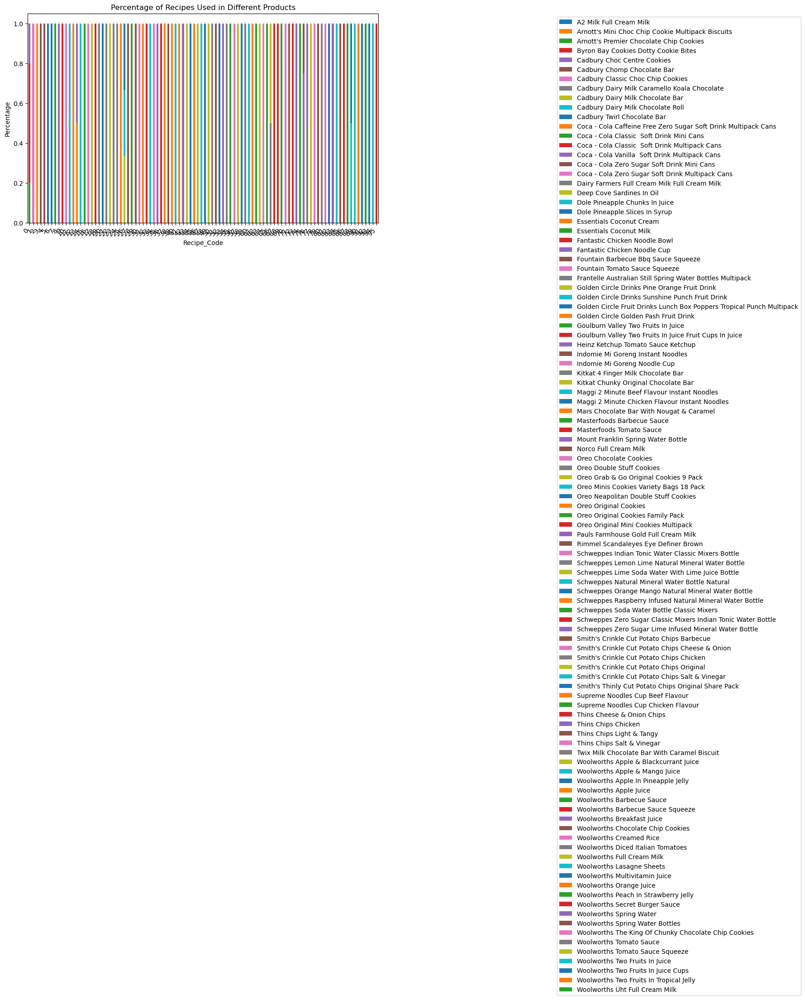

In [85]:
import pandas as pd

query = """
MATCH (p:Product)-[:HAS_RECIPE]->(c:Recipe)
RETURN p.name AS Product, c.ingredients_orig AS Recipe
"""

with driver.session() as session:
    result = session.run(query)
    neo4j_data = [record.data() for record in result]

# convert the data to DataFrame
df = pd.DataFrame(neo4j_data)

# Encode recipe as numeric value
recipe_codes = pd.factorize(df['Recipe'])[0]
df['Recipe_Code'] = recipe_codes

# Calculate the proportion of each recipe code appearing in different products
recipe_props = df.groupby(['Recipe_Code', 'Product']).size().groupby('Recipe_Code').apply(lambda x: x/x.sum()).unstack('Product')

# Reset index so recipe encoding is column name
recipe_props = recipe_props.reset_index().rename(columns={'level_0': 'Recipe_Code'})

# Draw a percentage stacked bar chart
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10, 6))
recipe_props.set_index('Recipe_Code').plot(kind='bar', stacked=True, ax=ax)

# Set title and rotated x-axis label
ax.set_title('Percentage of Recipes Used in Different Products')
plt.xticks(rotation=45, ha='right')

# Add y-axis title
ax.set_ylabel('Percentage')

#legend = ax.legend(bbox_to_anchor=(1.5, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [101]:
import pandas as pd
import plotly.graph_objs as go
from plotly.subplots import make_subplots

query = """
MATCH (p:Product)-[:HAS_RECIPE]->(c:Recipe)
RETURN p.name AS Product, c.ingredients_orig AS Recipe
"""

with driver.session() as session:
    result = session.run(query)
    neo4j_data = [record.data() for record in result]

df = pd.DataFrame(neo4j_data)
#print(df.head())


#Calculate the percentage of identical formulas that appear in each product
product_recipe_props = df.groupby(['Product', 'Recipe']).size().groupby('Recipe').apply(lambda x: x/x.sum()).unstack('Product')

# Reset index so recipe names are column names
product_recipe_props = product_recipe_props.reset_index()
#product_recipe_props = product_recipe_props.dropna()
print(product_recipe_props)
print(product_recipe_props.columns)


# creata Plotly figure
fig = go.Figure()

# Add stacked bar chart
for column in product_recipe_props.columns[1:]:
    fig.add_trace(go.Bar(x=product_recipe_props['Recipe'], y=product_recipe_props[column], name=column))


# layout
fig.update_layout(title='Percentage of Products Containing Each Recipe', xaxis_title='Recipe', yaxis_title='Percentage')

fig.show()





C:\Users\apple\AppData\Local\Temp\ipykernel_2404\4045532795.py:20: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



Product                                             Recipe  \
0                                100% Natural Spring Water   
1        <div>Our Chosen Ingredients: Noodle Cake: Whea...   
2        <p>Dark Chocolate Chips (40%) (Sugar, Cocoa Ma...   
3        <p>Sugar,  Milk  Solids,  Wheat  Flour, Cocoa ...   
4        Australian Grown Two Fruits (62%)Diced Pears &...   
..                                                     ...   
91       Wheat Flour, Milk Chocolate Chips (19%), (Suga...   
92       Wheat Flour, Sugar, Dark Compound Chocolate Ch...   
93       Wheat Flour, Sugar, Vegetable Oil, Cocoa Powde...   
94       Wheat Flour, Sugar, Vegetable Oil, Cocoa Powde...   
95       wheat flour, milk compound chocolate (27%) (su...   

Product  A2 Milk Full Cream Milk  \
0                            NaN   
1                            NaN   
2                            NaN   
3                            NaN   
4                            NaN   
..                           ...   
91 

KeyError: 'Product'

In [4]:

from neo4j import GraphDatabase

query = """
MATCH (p:Brand)-[:BELONGS_TO]->(c:Product)
RETURN p.name AS Brand, c.name AS Product
"""

def analyze_brand_products(brand):
    with driver.session() as session:
        result = session.run(query)
        for record in result:
            brand = record["Brand"]
            product = record["Product"]
            print(f"Brand: {brand}, Product: {product}")


analyze_brand_products("brand")

In [7]:
from neo4j import GraphDatabase


query = """
MATCH (p:Product)
RETURN p.name AS Product, p.price AS Price
"""

def analyze_product_price():
    prices = []
    with driver.session() as session:
        result = session.run(query)
        for record in result:
            price = record["Price"]
            if price is not None:
                prices.append(price)
    
    # analyse the price
    if prices:
        print("Price Analysis:")
        print(f"Average Price: {sum(prices) / len(prices)}")
        print(f"Max Price: {max(prices)}")
        print(f"Min Price: {min(prices)}")
    else:
        print("No price data available.")


analyze_product_price()


Price Analysis:
Average Price: 5.148692307692307
Max Price: 47.2
Min Price: 0.8


In [9]:
import plotly.graph_objects as go
from neo4j import GraphDatabase

query = """
MATCH (p:Product)
RETURN p.name AS Product, p.price AS Price
"""

def get_product_prices():
    products = []
    prices = []
    with driver.session() as session:
        result = session.run(query)
        for record in result:
            product = record["Product"]
            price = record["Price"]
            if price is not None:
                products.append(product)
                prices.append(price)
    return products, prices

# get the name and price
products, prices = get_product_prices()

# create Plotly scatter
fig = go.Figure(data=go.Scatter(x=products, y=prices, mode='markers'))

# set the layout
fig.update_layout(
    title="Product Prices",
    xaxis_title="Product",
    yaxis_title="Price"
)

# show
fig.show()
